In [6]:
import os
import numpy as np
import pandas as pd


In [7]:

option = []
x_test = []
y_test = []
x_train = []
y_train = []
x_val = []
y_val = []
path_condition = r'C:\Users\Poott\OneDrive\Desktop\CN240\CN240\csv'
for file in os.listdir(path_condition):
    option.append(file)
for folder in option:
    x_folder = []
    y_folder = []
    for file in os.listdir(r"C:\Users\Poott\OneDrive\Desktop\CN240\CN240\csv"+"/"+folder):
        # print(folder)
        emotional_check = ""
        data = pd.read_csv(r"C:\Users\Poott\OneDrive\Desktop\CN240\CN240\csv"+"/"+folder+"/"+file)
        x_temp = data["distance"].to_numpy()
        x_folder.append(x_temp)
        print(x_temp)

        data_score = pd.read_csv(r"C:\Users\Poott\OneDrive\Desktop\CN240\CN240\data\legend.csv")

        for i, imagename in enumerate(data_score["image"].to_numpy()):
            if imagename == file[:-4]:
                score = data_score.iloc[i]
                emotional_check = score["emotion"]
                emotional_check = emotional_check.lower()
                print(emotional_check)

            if emotional_check == "happiness":
                y_path = 0
            elif emotional_check == "anger":
                y_path = 1
            elif emotional_check == "disgust":
                y_path = 2
            elif emotional_check == "fear":
                y_path = 3
            elif emotional_check == "neutral":
                y_path = 4
            elif emotional_check == "sadness":
                y_path = 5
            elif emotional_check == "surprise":
                y_path = 6
            elif emotional_check == "contempt":
                y_path = 7
            
        y_folder.append(y_path)

        if folder == "test_csv":
            x_test = x_folder
            y_test = y_folder

        elif folder == "train_csv":
            x_train = x_folder
            y_train = y_folder
        if folder == "validate_csv":
            x_val = x_folder
            y_val = y_folder
    x_test = np.asarray(x_test)
    y_test = np.asarray(y_test)

    x_train = np.asarray(x_train)
    y_train = np.asarray(y_train)

    x_val = np.asarray(x_val)
    y_val = np.asarray(y_val)


[5.48105910e-02 8.90523912e-02 1.02959179e-01 1.08317036e-01
 1.00902690e-01 8.22164797e-02 5.99946039e-02 3.87357427e-02
 1.88356928e-02 6.39166837e-03 4.49510754e-04 1.40695139e-03
 9.34517527e-03 2.49519716e-02 4.75579996e-02 8.25418310e-02
 1.28107063e-01 2.60648292e-03 7.61164595e-03 2.99407560e-02
 4.85227200e-02 5.97412606e-02 1.02473469e-01 1.30565159e-01
 1.46165902e-01 1.51956532e-01 1.40714234e-01 4.01059047e-02
 1.53597805e-02 3.17057581e-03 5.47064723e-03 3.12755535e-03
 1.29146925e-03 1.13294272e-05 8.22107151e-04 1.98643452e-05
 4.88899285e-03 1.44284148e-02 1.38758588e-02 4.44281387e-03
 2.16357579e-04 5.81107798e-02 8.56353295e-02 9.76032724e-02
 9.56114455e-02 7.73108410e-02 6.62684612e-02 3.15045664e-02
 1.84053926e-02 1.01628642e-02 5.49240637e-03 1.63705083e-03
 2.44243737e-04 3.92024483e-05 1.37737697e-03 5.08041821e-03
 1.02679687e-02 1.70305389e-02 2.40372085e-02 2.66936467e-02
 1.24528219e-02 6.99571543e-03 2.63516457e-03 5.00307156e-05
 2.86293910e-03 7.017717

In [11]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib as plt
import scikitplot as skplt
from sklearn.metrics import ConfusionMatrixDisplay


AttributeError: module 'matplotlib' has no attribute 'show'

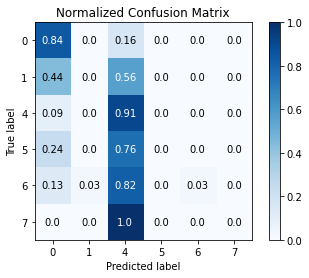

In [12]:
rf = RandomForestClassifier()
rf = rf.fit(x_train, y_train)
predicted_probas = rf.predict_proba(x_test)
skplt.metrics.plot_confusion_matrix(y_test, predicted_probas, normalize=True)
plt.show()


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

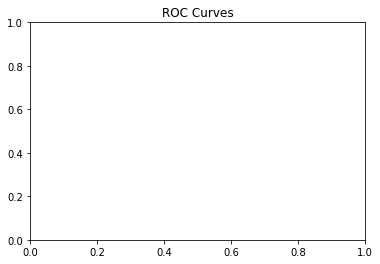

In [13]:
skplt.metrics.plot_roc(y_test, predicted_probas)
plt.show()
